In [19]:
from icecream import ic
import pandas as pd
from dateutil.relativedelta import relativedelta
# from dhs_preprocessing_functions import *
from pandarallel import pandarallel
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import os
# Initialization
pandarallel.initialize()

from dhs_preprocessing_functions import final_ds_droping_cols

INFO: Pandarallel will run on 24 workers.
INFO: Pandarallel will use Memory file system to transfer data between the main process and workers.


In [20]:
input_dir = "/mnt/datadisk/data/Projects/water/inputs/"
# min_version = 3
overwrite_pqt = True
dataset_type = 'HR'  #, 'BR', 'CR', 'HW', 'IR', 'KR', 'MR', 'PR', 'AR'] ??['AN', 'FC, 'FP', 'HW', 'PV', 'SC'] < 25 surveys
urban_rural_all_mode = 'all' # 'all', 'U', 'R'
group_by_col = 'adm2_gaul'
out_f = f"{input_dir}5_grouped_df_V3_{dataset_type}_{group_by_col}_joined_with_ipc_{urban_rural_all_mode}.pkl"
scale_numerical_data = True

in_f = f"{input_dir}5_grouped_df_V3_{dataset_type}_{group_by_col}_joined_with_ipc_{urban_rural_all_mode}.pkl"

base_out_name = f"{input_dir}IPC_Correlation_matrix_{dataset_type}_{group_by_col}_{urban_rural_all_mode}"


In [21]:
input_df = pd.read_pickle(in_f)
numeric_df = final_ds_droping_cols(input_df, drop_meta=True, drop_food_help=True, drop_perc=3, 
                           drop_data_sets=['DHS Cat', 'Meta one-hot encoding', 'Meta frequency encoding'], 
                           numerical_data=['mean'], retain_year=True,
                 retain_adm=False, retain_month=False, drop_highly_correlated_cols=False, drop_region=False, verbose=3)

Dropped DHS Cat; data: ['DHS Cat; type of place of residence: rural', 'DHS Cat; type of place of residence: urban', 'DHS Cat; type of place of residence: NaN', 'DHS Cat; source of drinking water: other', 'DHS Cat; source of drinking water: piped into dwelling', 'DHS Cat; source of drinking water: piped to neighbor', 'DHS Cat; source of drinking water: piped to yard/plot', 'DHS Cat; source of drinking water: protected spring', 'DHS Cat; source of drinking water: protected well', 'DHS Cat; source of drinking water: public tap/standpipe', 'DHS Cat; source of drinking water: rainwater', 'DHS Cat; source of drinking water: river/dam/lake/ponds/stream/canal/irrigation channel', 'DHS Cat; source of drinking water: sachet water', 'DHS Cat; source of drinking water: tube well or borehole', 'DHS Cat; source of drinking water: unprotected spring', 'DHS Cat; source of drinking water: unprotected well', 'DHS Cat; source of drinking water: water seller', 'DHS Cat; source of drinking water: well in r

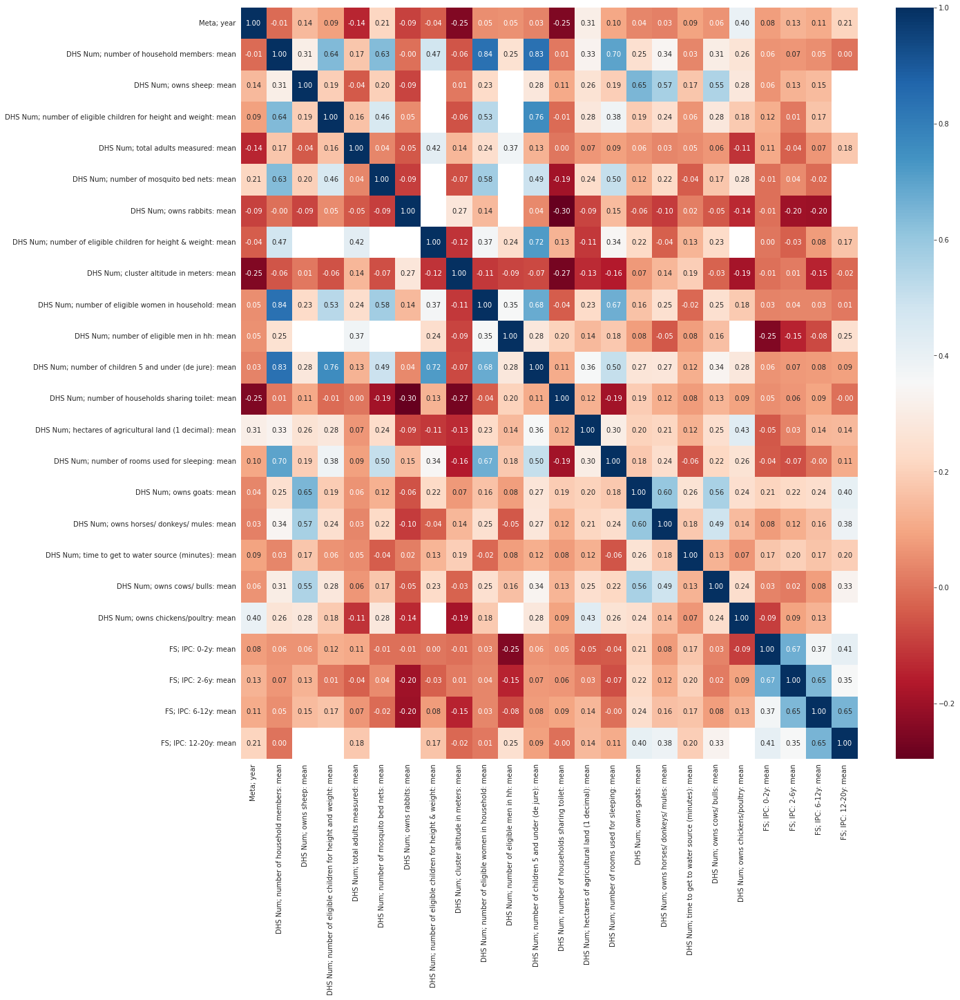

In [22]:
corr = numeric_df.corr()
sns.set_style("whitegrid")

# ic(corr)
plt.figure(figsize=(20, 20))
sns.heatmap(corr, annot=True, cmap='RdBu', fmt=".2f")
#save fig
plt.savefig(base_out_name + '_Numeric.png')
plt.show()

In [23]:
string_df = final_ds_droping_cols(input_df.copy(), drop_meta=True, drop_food_help=True, drop_perc=3, 
                           drop_data_sets=['Meta', 'DHS Num', 'Meta one-hot encoding', 'Meta frequency encoding'], 
                           numerical_data=['mean'],
                 retain_adm=False, retain_month=False, drop_highly_correlated_cols=False, drop_region=True, verbose=3)

Dropped Meta; data: ['Meta; adm1_gaul', 'Meta; adm0_gaul', 'Meta; year', 'Meta; month', 'Meta; date', 'Meta; amount of households', 'Meta; DHS Num; number of household members: percentage of valid answers', 'Meta; DHS Num; owns sheep: percentage of valid answers', 'Meta; DHS Num; number of eligible children for height and weight: percentage of valid answers', 'Meta; DHS Num; total adults measured: percentage of valid answers', 'Meta; DHS Num; number of mosquito bed nets: percentage of valid answers', 'Meta; DHS Num; owns rabbits: percentage of valid answers', 'Meta; DHS Num; number of eligible children for height & weight: percentage of valid answers', 'Meta; DHS Num; cluster altitude in meters: percentage of valid answers', 'Meta; DHS Num; number of eligible women in household: percentage of valid answers', 'Meta; DHS Num; number of eligible men in hh: percentage of valid answers', 'Meta; DHS Num; number of children 5 and under (de jure): percentage of valid answers', 'Meta; DHS Num; 

Dropped numerical data: []
Dropped one of double cat similar length DHS Cat; type of place of residence: urban
Dropped one of double cat similar length DHS Cat; has electricity: no
Dropped one of double cat similar length DHS Cat; has radio: no
Dropped one of double cat similar length DHS Cat; has bicycle: no
Dropped one of double cat similar length DHS Cat; has car/truck: no
Dropped one of double cat similar length DHS Cat; has refrigerator: no
Dropped one of double cat similar length DHS Cat; has telephone (land-line): no
Dropped one of double cat similar length DHS Cat; has bank account: no
Dropped one of double cat similar length DHS Cat; anything done to water to make safe to drink: no
Dropped one of double cat similar length DHS Cat; water usually treated by: boil: no
Dropped one of double cat similar length DHS Cat; water usually treated by: add bleach/chlorine: no
Dropped one of double cat similar length DHS Cat; household selected for domestic violence module: household select

In [24]:
string_df_bak = string_df.copy()
string_df.reset_index(inplace=True, drop=True)

In [25]:
# Initialize an empty dictionary to store the column groups
column_groups = {}

fs_cols = []
# For each column in string_df
for col in string_df.columns:
    # print(col)
    if 'household selected' in col or 'language' in col:
        print(col)
        continue
    if 'FS;' in col:
        print(col)
        fs_cols.append(col)
        continue
    # Split the column name by ': ' and take all parts except the last one to get the stem
    stem = None
    if ': ' in col:
        stem = col.split(': ', 1)[0]
        # stem = ': '.join(col.split(': ')[:-1])
        # print('stem', stem)
    else:
        ic('!!!!!!!!!no : ', col)
    
    if not stem:
        print('!!!!!!!!!no stem', stem)
        continue
    # If the stem is not already a key in the dictionary, add it with an empty list as the value
    if stem not in column_groups:
        column_groups[stem] = []
    
    # Append the full column name to the list of columns for this stem
    if not ': NaN' in col:
        column_groups[stem].append(col)
    else:
        print('!!!!!!!!!NAN')

print(len(string_df.columns), len(column_groups.values()), len(column_groups.keys()))
column_groups

DHS Cat; household selected for domestic violence module: household not selected
DHS Cat; household selected for domestic violence module: household selected
DHS Cat; household selected for domestic violence module: household selected: dv men
DHS Cat; household selected for domestic violence module: man selected
DHS Cat; household selected for domestic violence module: woman selected
FS; IPC: 0-2y: mean
FS; IPC: 2-6y: mean
FS; IPC: 6-12y: mean
FS; IPC: 12-20y: mean
139 47 47


{'DHS Cat; type of place of residence': ['DHS Cat; type of place of residence: rural'],
 'DHS Cat; source of drinking water': ['DHS Cat; source of drinking water: other',
  'DHS Cat; source of drinking water: piped into dwelling',
  'DHS Cat; source of drinking water: piped to neighbor',
  'DHS Cat; source of drinking water: piped to yard/plot',
  'DHS Cat; source of drinking water: protected spring',
  'DHS Cat; source of drinking water: protected well',
  'DHS Cat; source of drinking water: public tap/standpipe',
  'DHS Cat; source of drinking water: rainwater',
  'DHS Cat; source of drinking water: river/dam/lake/ponds/stream/canal/irrigation channel',
  'DHS Cat; source of drinking water: sachet water',
  'DHS Cat; source of drinking water: tube well or borehole',
  'DHS Cat; source of drinking water: unprotected spring',
  'DHS Cat; source of drinking water: unprotected well',
  'DHS Cat; source of drinking water: water seller',
  'DHS Cat; source of drinking water: well in reside

In [26]:
# Initialize PCA with a maximum of 3 components
# pca = PCA(n_components=3)
pcas = []

# Initialize a DataFrame to store the principal components
pca_df = pd.DataFrame()

# For each categorical column in string_df
for final_n, cols in column_groups.items():   
    data = string_df[cols]
    standardized = StandardScaler().fit_transform(data.dropna())
 
    # Standardize the one-hot encoded data
    standardized = string_df[cols].to_numpy()
    # drop NaNs
    standardized = standardized[~np.isnan(standardized).any(axis=1)]
    
    # Initialize PCA with a maximum of 3 components
    print(standardized.shape)
    n_components = min(3, standardized.shape[1])
    pca = PCA(n_components=n_components)
    
    # Apply PCA
    principal_components = pca.fit_transform(standardized)
    
    # Calculate the cumulative explained variance
    cumulative_explained_variance = np.cumsum(pca.explained_variance_ratio_)
    
    # Find the number of components to keep
    n_components_to_keep = np.argmax(cumulative_explained_variance > 0.8) + 1
    
    # Find the number of components to keep
    if np.any(cumulative_explained_variance > 0.8):
        n_components_to_keep = np.argmax(cumulative_explained_variance > 0.8) + 1
    else:
        n_components_to_keep = min(len(cumulative_explained_variance), 3)
        
    
    # Print the variance explained by the components to keep
    for i in range(n_components_to_keep):
        print(f'Variance explained by {final_n}_PC{i+1}: {pca.explained_variance_ratio_[i]}')
    print(f'Cumulative variance explained by {final_n}_PC1 to PC{n_components_to_keep}: {cumulative_explained_variance[n_components_to_keep-1]}')
    print(final_n, cols)
    print(len(pca.explained_variance_ratio_),'\n')
 
    # Convert the principal components to a DataFrame
    principal_components_df = pd.DataFrame(data=principal_components[:, :n_components_to_keep], columns=[f'{final_n}_PC{i}' for i in range(1, n_components_to_keep + 1)])

    # Merge the principal components to pca_df
    pca_df = pca_df.merge(principal_components_df, left_index=True, right_index=True, how='outer')
print(pca_df.shape, string_df.shape)
assert len(pca_df) == len(string_df)
pca_df = pca_df.merge(string_df[fs_cols], left_index=True, right_index=True, how='outer')
pca_df[fs_cols] = string_df[fs_cols].reset_index(drop=True)
# pca_df = pd.concat(pcas, axis=1)
pca_df


(15252, 1)
Variance explained by DHS Cat; type of place of residence_PC1: 1.0
Cumulative variance explained by DHS Cat; type of place of residence_PC1 to PC1: 1.0
DHS Cat; type of place of residence ['DHS Cat; type of place of residence: rural']
1 

(15210, 15)
Variance explained by DHS Cat; source of drinking water_PC1: 0.24307125192740556
Variance explained by DHS Cat; source of drinking water_PC2: 0.20462968339689475
Variance explained by DHS Cat; source of drinking water_PC3: 0.14806063747993428
Cumulative variance explained by DHS Cat; source of drinking water_PC1 to PC3: 0.5957615728042346
DHS Cat; source of drinking water ['DHS Cat; source of drinking water: other', 'DHS Cat; source of drinking water: piped into dwelling', 'DHS Cat; source of drinking water: piped to neighbor', 'DHS Cat; source of drinking water: piped to yard/plot', 'DHS Cat; source of drinking water: protected spring', 'DHS Cat; source of drinking water: protected well', 'DHS Cat; source of drinking water: pub

Variance explained by DHS Cat; items present_PC1: 0.7937674597775184
Variance explained by DHS Cat; items present_PC2: 0.19839556449433005
Cumulative variance explained by DHS Cat; items present_PC1 to PC2: 0.9921630242718484
DHS Cat; items present ['DHS Cat; items present: soap or detergent: no', 'DHS Cat; items present: soap or detergent: not applicable', 'DHS Cat; items present: soap or detergent: yes', 'DHS Cat; items present: ash, mud, sand: no', 'DHS Cat; items present: ash, mud, sand: not applicable', 'DHS Cat; items present: ash, mud, sand: yes', 'DHS Cat; items present: none: no', 'DHS Cat; items present: none: not applicable', 'DHS Cat; items present: none: yes, no cleansing agent observed']
3 

(12464, 3)
Variance explained by DHS Cat; location of toilet facility_PC1: 0.9210273337000401
Cumulative variance explained by DHS Cat; location of toilet facility_PC1 to PC1: 0.9210273337000401
DHS Cat; location of toilet facility ['DHS Cat; location of toilet facility: elsewhere', '

,DHS Cat; type of place of residence_PC1,DHS Cat; source of drinking water_PC1,DHS Cat; source of drinking water_PC2,DHS Cat; source of drinking water_PC3,DHS Cat; has electricity_PC1,DHS Cat; has radio_PC1,DHS Cat; has bicycle_PC1,DHS Cat; has car/truck_PC1,DHS Cat; type of toilet facility_PC1,DHS Cat; type of toilet facility_PC2,...,DHS Cat; chair_PC1,DHS Cat; has television_PC1,DHS Cat; has motorcycle/scooter_PC1,"DHS Cat; owns livestock, herds or farm animals_PC1",DHS Cat; number of households sharing toilet_PC1,DHS Cat; URBAN_RURA_PC1,FS; IPC: 0-2y: mean,FS; IPC: 2-6y: mean,FS; IPC: 6-12y: mean,FS; IPC: 12-20y: mean
0,-0.287432,0.037115,-0.110118,-0.179417,-0.350219,0.047390,0.000736,-0.012762,0.228399,-0.136311,...,-0.070567,-0.081674,-0.043805,0.356981,0.235198,-0.287754,NaN,NaN,NaN,NaN
1,-0.287432,-0.061398,-0.244379,-0.328735,-0.030219,-0.390944,-0.199264,-0.012762,0.154885,-0.041857,...,0.004452,0.278326,0.276195,0.332235,0.155198,-0.287754,NaN,NaN,NaN,NaN
2,-0.287432,-0.037700,-0.240924,0.047350,-0.310219,-0.112610,0.440736,-0.052762,-0.100323,-0.067598,...,-0.147490,-0.241674,-0.043805,0.295443,-0.044802,-0.287754,NaN,NaN,NaN,NaN
3,-0.287432,0.094010,-0.056234,-0.139503,0.066447,-0.015944,-0.197597,-0.052762,0.635515,-0.057276,...,0.124723,0.093326,0.084528,0.180574,0.590198,-0.287754,NaN,NaN,NaN,NaN
4,-0.287432,-0.042343,-0.180436,-0.173526,-0.350219,0.304232,0.181789,-0.052762,0.521394,-0.112418,...,-0.147490,-0.281674,-0.071173,0.164674,0.504671,-0.287754,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15247,-0.287432,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,-0.034802,-0.287754,2.500000,2.583333,2.5,NaN
15248,-0.287432,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,0.145577,-0.287754,2.666667,2.666667,3.0,NaN
15249,-0.287432,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,0.437970,-0.287754,2.166667,2.583333,3.0,NaN
15250,-0.287432,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,-0.138649,-0.287754,1.500000,1.583333,1.0,NaN


In [27]:
for col in pca_df.columns:
    print(col, len(pca_df[col].dropna())/len(pca_df) * 100)

DHS Cat; type of place of residence_PC1 100.0
DHS Cat; source of drinking water_PC1 99.72462627852084
DHS Cat; source of drinking water_PC2 99.72462627852084
DHS Cat; source of drinking water_PC3 99.72462627852084
DHS Cat; has electricity_PC1 99.72462627852084
DHS Cat; has radio_PC1 98.01337529504328
DHS Cat; has bicycle_PC1 99.72462627852084
DHS Cat; has car/truck_PC1 91.68633621820089
DHS Cat; type of toilet facility_PC1 99.72462627852084
DHS Cat; type of toilet facility_PC2 99.72462627852084
DHS Cat; type of toilet facility_PC3 99.72462627852084
DHS Cat; has refrigerator_PC1 98.09861001835824
DHS Cat; translator used_PC1 49.77052189876737
DHS Cat; has telephone (land-line)_PC1 55.72383949645948
DHS Cat; has bank account_PC1 55.61893522161028
DHS Cat; share toilet with other households_PC1 96.95121951219512
DHS Cat; share toilet with other households_PC2 96.95121951219512
DHS Cat; location of source for water_PC1 99.72462627852084
DHS Cat; location of source for water_PC2 99.72462627

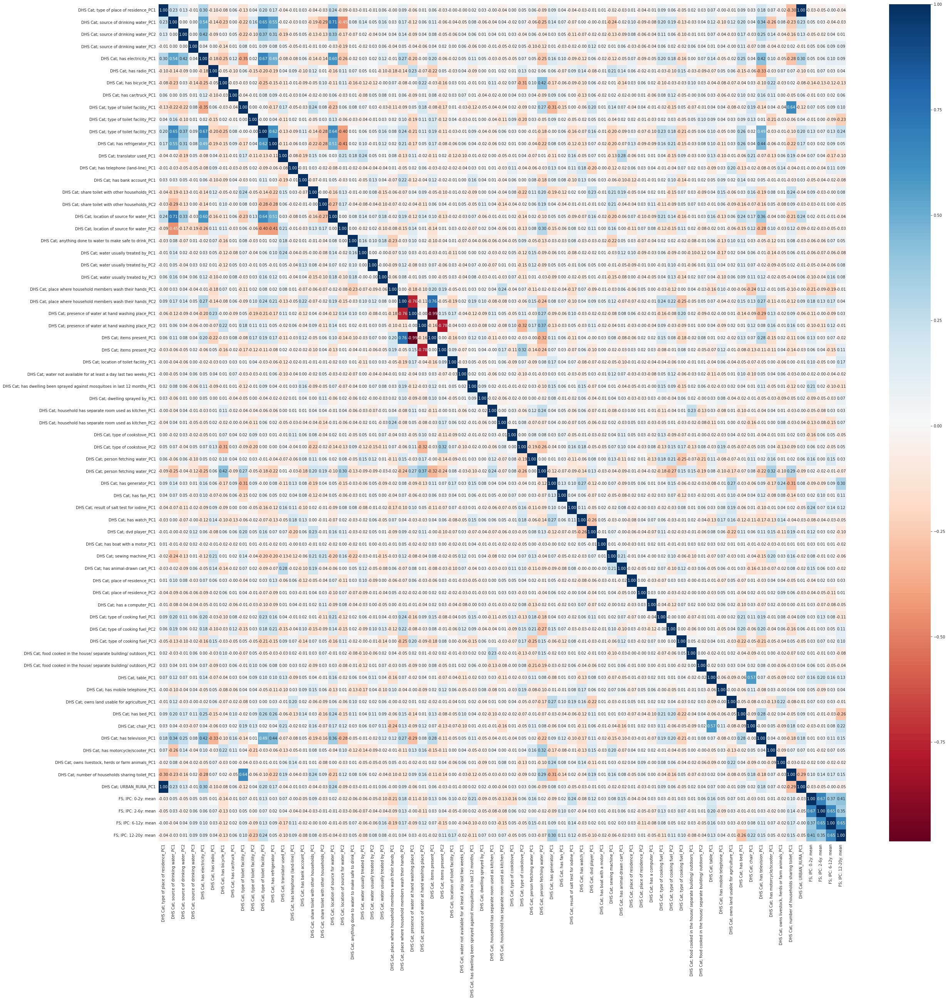

In [28]:

corr = pca_df.corr()
sns.set_style("whitegrid")

# ic(corr)
plt.figure(figsize=(40, 40))
sns.heatmap(corr, cmap='RdBu',annot=True, fmt=".2f")#  annot=True,
#save fig
plt.savefig(base_out_name + '_Categorical_single_PCAs.png')
plt.show()

In [29]:
combined_df = final_ds_droping_cols(input_df.copy(), drop_meta=True, drop_food_help=True, drop_perc=3, 
                           drop_data_sets=['Meta', 'Meta one-hot encoding', 'Meta frequency encoding'], 
                           numerical_data=['mean'],
                 retain_adm=False, retain_month=False, drop_highly_correlated_cols=False, drop_region=True, verbose=3)

Dropped Meta; data: ['Meta; adm1_gaul', 'Meta; adm0_gaul', 'Meta; year', 'Meta; month', 'Meta; date', 'Meta; amount of households', 'Meta; DHS Num; number of household members: percentage of valid answers', 'Meta; DHS Num; owns sheep: percentage of valid answers', 'Meta; DHS Num; number of eligible children for height and weight: percentage of valid answers', 'Meta; DHS Num; total adults measured: percentage of valid answers', 'Meta; DHS Num; number of mosquito bed nets: percentage of valid answers', 'Meta; DHS Num; owns rabbits: percentage of valid answers', 'Meta; DHS Num; number of eligible children for height & weight: percentage of valid answers', 'Meta; DHS Num; cluster altitude in meters: percentage of valid answers', 'Meta; DHS Num; number of eligible women in household: percentage of valid answers', 'Meta; DHS Num; number of eligible men in hh: percentage of valid answers', 'Meta; DHS Num; number of children 5 and under (de jure): percentage of valid answers', 'Meta; DHS Num; 

Dropped numerical data: ['DHS Num; number of household members: median', 'DHS Num; number of household members: std', 'DHS Num; number of household members: skewness', 'DHS Num; number of household members: kurtosis', 'DHS Num; owns sheep: median', 'DHS Num; owns sheep: std', 'DHS Num; owns sheep: skewness', 'DHS Num; owns sheep: kurtosis', 'DHS Num; number of eligible children for height and weight: median', 'DHS Num; number of eligible children for height and weight: std', 'DHS Num; number of eligible children for height and weight: skewness', 'DHS Num; number of eligible children for height and weight: kurtosis', 'DHS Num; total adults measured: median', 'DHS Num; total adults measured: std', 'DHS Num; total adults measured: skewness', 'DHS Num; total adults measured: kurtosis', 'DHS Num; number of mosquito bed nets: median', 'DHS Num; number of mosquito bed nets: std', 'DHS Num; number of mosquito bed nets: skewness', 'DHS Num; number of mosquito bed nets: kurtosis', 'DHS Num; owns

In [30]:
for col in combined_df.columns:
    print(col, len(combined_df[col].dropna())/len(combined_df) * 100)   

DHS Num; number of household members: mean 100.0
DHS Num; owns sheep: mean 69.06635195384212
DHS Num; number of eligible children for height and weight: mean 55.435352740624175
DHS Num; total adults measured: mean 64.86362444269605
DHS Num; number of mosquito bed nets: mean 52.87831104117493
DHS Num; owns rabbits: mean 11.860739575137687
DHS Num; number of eligible children for height & weight: mean 31.215578284815106
DHS Num; cluster altitude in meters: mean 62.60818253343824
DHS Num; number of eligible women in household: mean 99.72462627852084
DHS Num; number of eligible men in hh: mean 33.10385523210071
DHS Num; number of children 5 and under (de jure): mean 95.88906372934697
DHS Num; number of households sharing toilet: mean 96.85942827170207
DHS Num; hectares of agricultural land (1 decimal): mean 68.22056123787044
DHS Num; number of rooms used for sleeping: mean 77.89142407553108
DHS Num; owns goats: mean 70.03671649619722
DHS Num; owns horses/ donkeys/ mules: mean 70.0367164961

In [31]:
pca_food = ['has refrigerator', 'type of cooking fuel', 'food cooked in the house/ separate building/ outdoors', 
            'household has separate room used as kitchen', 'type of cookstove', 'result of salt test for iodine']
pca_general_info = ['type of place of residence', 'cluster altitude in meters', 'place of residence']
pca_water = ['source of drinking water', 'time to get to water source (minutes)', 'location of source for water', 'anything done to water to make safe to drink', 
              'water not available for at least a day last two weeks', 'person fetching water']
pca_water_treatment = ['water usually treated by: add bleach/chlorine', 'water usually treated by: boil', 'water usually treated by: let it stand and settle', 
                       'water usually treated by: strain through a cloth', 'water usually treated by: use water filter', 'water usually treated by: solar disinfection', 
                       'water usually treated by: other']
pca_elecricity = ['has electricity', 'has generator']
pca_transportation = ['has bicycle', 'has motorcycle/scooter', 'has car/truck', 'has boat with a motor', 'has animal-drawn cart',]
pca_sanitation =['type of toilet facility', 'share toilet with other households', 'number of households sharing toilet', 'place where household members wash their hands', 
                 'presence of water at hand washing place', 'location of toilet facility']
pca_communication = ['has telephone (land-line)', 'has radio', 'has a computer', 'has mobile telephone', 'has television', 'dvd player']
pca_demographics = ['total adults measured', 'amount of households', 'number of eligible women in household', 
                    'number of eligible men in hh', 'number of children 5 and under (de jure)', 'number of household members']
pca_malaria = ['number of mosquito bed nets', 'has dwelling been sprayed against mosquitoes in last 12 months']
pca_agriculture = ['owns rabbits', 'hectares of agricultural land (1 decimal)', 'owns goats', 'owns horses/ donkeys/ mules','owns cows/ bulls', 'owns chickens/poultry', 'sewing machine',
                   'owns land usable for agriculture', 'owns sheep', 'owns livestock, herds or farm animals']

pca_housing = ['has watch', 'number of rooms used for sleeping', 'has bank account', 'table']
pca_cleaning_utensiles = ['items present: soap or detergent', 'items present: ash, mud, sand', 'items present: none']
dwelling_sprayed_malaria = ['dwelling sprayed by: government worker/program', 'dwelling sprayed by: private company', 'dwelling sprayed by: ngo', 'dwelling sprayed by: other']

combined_df.reset_index(inplace=True, drop=True)

In [32]:
pca_infrastructure = pca_water[:-1] + pca_elecricity[:-1] + pca_transportation + pca_sanitation + pca_communication
pca_water_combined = pca_water[:-1] + pca_water_treatment
pca_all = pca_food + pca_general_info + pca_water + pca_water_treatment + pca_elecricity + pca_transportation + pca_sanitation \
    + pca_communication + pca_demographics + pca_malaria + pca_agriculture + pca_housing + pca_cleaning_utensiles + dwelling_sprayed_malaria
pca_dfs_d = {}

for perc in range(0, 100, 10):
    # Initialize a DataFrame to store the principal components
    pca_df = pd.DataFrame()
    for pca_l, final_n in [(pca_food, 'food utensiles'), (pca_general_info, 'general info'), (pca_water, 'water infrastructure'), (pca_water_treatment, 'water treatment'), 
                (pca_elecricity, 'electricity'), (pca_transportation, 'transportation'), (pca_sanitation, 'sanitation'), (pca_communication, 'communication'), 
                (pca_demographics, 'demographics'), (pca_malaria, 'malaria'), (pca_agriculture, 'agriculture'), 
                (pca_housing, 'housing'), (pca_cleaning_utensiles, 'cleaning utensiles'), (dwelling_sprayed_malaria, 'dwelling sprayed malaria'),
                (pca_infrastructure, 'infrastructure'), (pca_water_combined, 'water infrastructure including treatment'), (pca_all, 'whole DS')]:
        
        #drop cols below x-percentage
        # final_cols = []
        # for col in pca_l:
            
        
        print('final_n', final_n)
        final_cols = []
        # Catch correct columns
        for col in pca_l:    
            # print('col', col)
            subset = [c for c in combined_df.columns if col in c]
            final_col = col + ': ' + 'mean'
            if final_col in subset:
                # print('numeric', final_col)
                final_cols.append(final_col)
            else:
                subset = [c for c in subset if c[-3:] != 'NaN']
                # print('str', subset)
                final_cols.extend(subset)
        final_cols = list(set(final_cols))
        for col in final_cols:
            if len(combined_df[col].dropna()) / len(combined_df) * 100 < perc:
                final_cols.remove(col)
        print('final', final_cols)    
        
        if not final_cols:
            continue
        
        # Select the subset of columns you're interested in
        subset_df = combined_df[final_cols]

        # Drop rows with NaNs from this subset
        subset_df = subset_df.dropna()
        
        if len(subset_df) < 100:
            print(f'too small for available data perc of {perc}, remaining data: {len(subset_df)}')
            continue

        # Capture the valid indices after dropping NaNs
        valid_index = subset_df.index

        # Standardize
        scaler = StandardScaler()
        subset_df = pd.DataFrame(scaler.fit_transform(subset_df), columns=subset_df.columns, index=valid_index)
        
        standardized = subset_df.to_numpy()
        # print(standardized.shape)
        # drop NaNs
        standardized = standardized[~np.isnan(standardized).any(axis=1)]
        
        # Assuming standardized DataFrame has been created and NaNs have been dropped

        # Initialize PCA with a maximum of 3 components
        # print(standardized.shape)
        n_components = min(6, standardized.shape[1])
        pca = PCA(n_components=n_components)
        
        # Apply PCA
        principal_components = pca.fit_transform(standardized)

    
        # Calculate the cumulative explained variance
        cumulative_explained_variance = np.cumsum(pca.explained_variance_ratio_)
        
        # Find the number of components to keep
        n_components_to_keep = np.argmax(cumulative_explained_variance > 0.8) + 1
        
        # Find the number of components to keep
        if np.any(cumulative_explained_variance > 0.8):
            n_components_to_keep = np.argmax(cumulative_explained_variance > 0.8) + 1
        else:
            n_components_to_keep = min(len(cumulative_explained_variance), 6)
            
        
        # Print the variance explained by the components to keep
        # for i in range(n_components_to_keep):
        #     print(f'Variance explained by {final_n}_PC{i+1}: {pca.explained_variance_ratio_[i]}')
        # print(f'Cumulative variance explained by {final_n}_PC1 to PC{n_components_to_keep}: {cumulative_explained_variance[n_components_to_keep-1]}')
        # print(len(pca.explained_variance_ratio_), n_components_to_keep)

        # Convert the principal components to a DataFrame
        principal_components_df = pd.DataFrame(data=principal_components[:, :n_components_to_keep], 
                                        columns=[f'{final_n}_PC{i}' for i in range(1, n_components_to_keep + 1)],
                                        index=valid_index)  # Use the valid indices here


        pca_df = pca_df.merge(principal_components_df, left_index=True, right_index=True, how='outer')

    # Assuming 'IPC' is the column name for the IPC values in combined_df
    pca_df = pca_df.merge(combined_df[[c for c in combined_df if 'IPC' in c]], left_index=True, right_index=True, how='outer')
    # pca_df = pca_df[sorted_cols + [c for c in pca_df.columns if c not in sorted_cols]]
    pca_dfs_d[perc] = pca_df


final_n food utensiles
final ['DHS Cat; type of cooking fuel: no food cooked in house', 'DHS Cat; type of cooking fuel: lpg', 'DHS Cat; type of cooking fuel: animal dung', 'DHS Cat; food cooked in the house/ separate building/ outdoors: outdoors', 'DHS Cat; food cooked in the house/ separate building/ outdoors: in a separate building', 'DHS Cat; type of cookstove: three stone stove/open fire', 'DHS Cat; type of cookstove: electric stove', 'DHS Cat; type of cooking fuel: firewood, straw', 'DHS Cat; result of salt test for iodine: no iodine', 'DHS Cat; household has separate room used as kitchen: yes', 'DHS Cat; type of cooking fuel: kerosene', 'DHS Cat; type of cooking fuel: wood', 'DHS Cat; result of salt test for iodine: iodine present', 'DHS Cat; type of cookstove: no food cooked in household', 'DHS Cat; food cooked in the house/ separate building/ outdoors: in the house', 'DHS Cat; type of cooking fuel: other', 'DHS Cat; type of cooking fuel: electricity', 'DHS Cat; type of cookstov

final_n whole DS
final ['DHS Cat; water usually treated by: other: yes', 'DHS Cat; type of cooking fuel: no food cooked in house', 'DHS Cat; type of cooking fuel: lpg', 'DHS Cat; presence of water at hand washing place: water not available', 'DHS Cat; has motorcycle/scooter: yes', 'DHS Cat; source of drinking water: protected spring', 'DHS Cat; place of residence: countryside', 'DHS Cat; type of cookstove: three stone stove/open fire', 'DHS Num; number of eligible women in household: mean', 'DHS Cat; type of toilet facility: other flush', 'DHS Cat; type of toilet facility: flush to septic tank', 'DHS Num; hectares of agricultural land (1 decimal): mean', 'DHS Cat; type of cookstove: electric stove', 'DHS Cat; household has separate room used as kitchen: yes', 'DHS Num; owns cows/ bulls: mean', 'DHS Cat; source of drinking water: public tap/standpipe', 'DHS Cat; has watch: yes', 'DHS Cat; water usually treated by: add bleach/chlorine: yes', 'DHS Cat; type of cooking fuel: wood', 'DHS Ca

In [33]:
print(len(pca_df.columns.tolist()))
pca_df.columns.tolist()

55


['food utensiles_PC1',
 'food utensiles_PC2',
 'food utensiles_PC3',
 'food utensiles_PC4',
 'general info_PC1',
 'general info_PC2',
 'water infrastructure_PC1',
 'water infrastructure_PC2',
 'water infrastructure_PC3',
 'water infrastructure_PC4',
 'water infrastructure_PC5',
 'water infrastructure_PC6',
 'water treatment_PC1',
 'water treatment_PC2',
 'water treatment_PC3',
 'electricity_PC1',
 'transportation_PC1',
 'transportation_PC2',
 'transportation_PC3',
 'sanitation_PC1',
 'sanitation_PC2',
 'sanitation_PC3',
 'sanitation_PC4',
 'sanitation_PC5',
 'sanitation_PC6',
 'communication_PC1',
 'communication_PC2',
 'communication_PC3',
 'demographics_PC1',
 'malaria_PC1',
 'agriculture_PC1',
 'agriculture_PC2',
 'agriculture_PC3',
 'housing_PC1',
 'housing_PC2',
 'cleaning utensiles_PC1',
 'cleaning utensiles_PC2',
 'dwelling sprayed malaria_PC1',
 'dwelling sprayed malaria_PC2',
 'infrastructure_PC1',
 'infrastructure_PC2',
 'infrastructure_PC3',
 'infrastructure_PC4',
 'infrastr

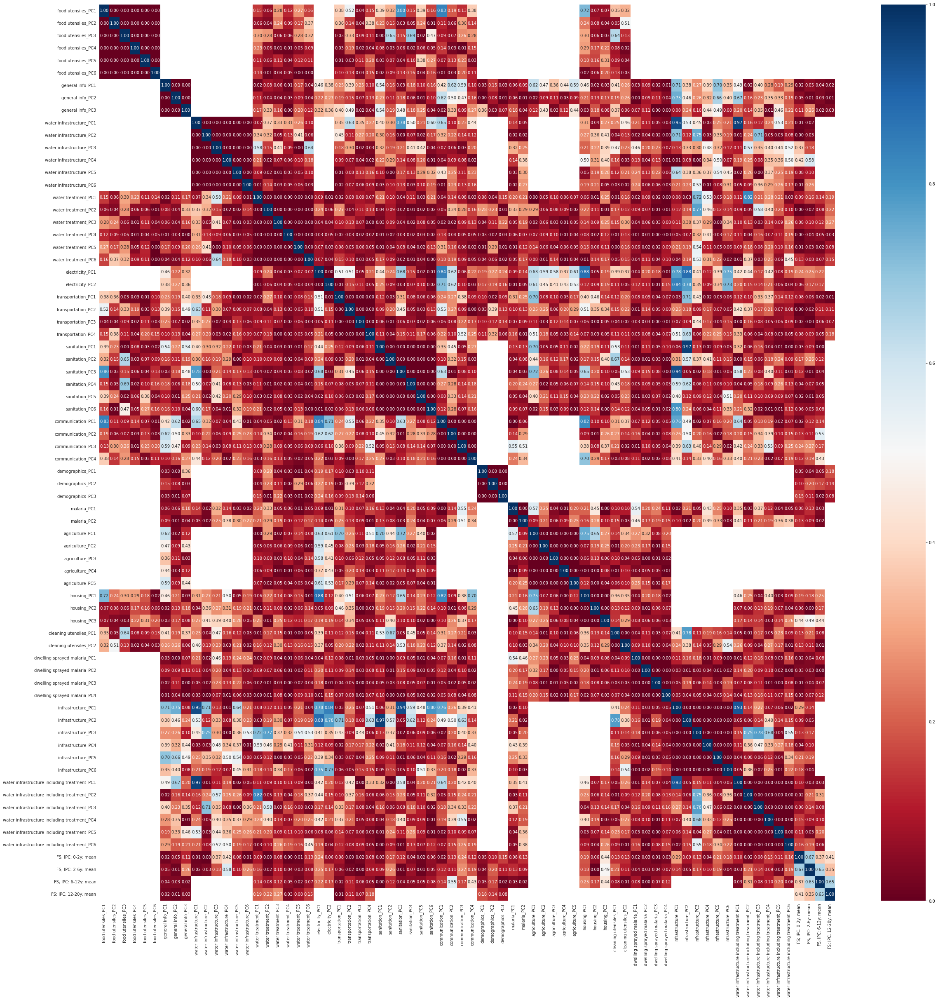

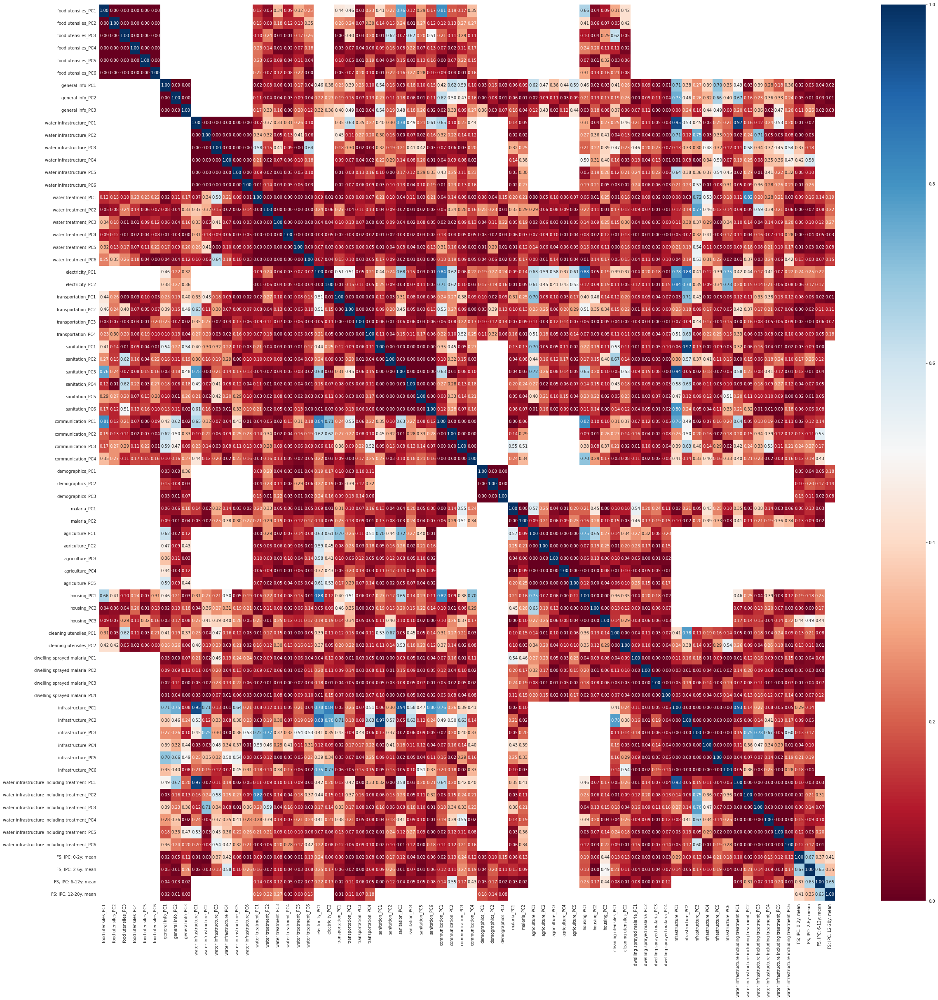

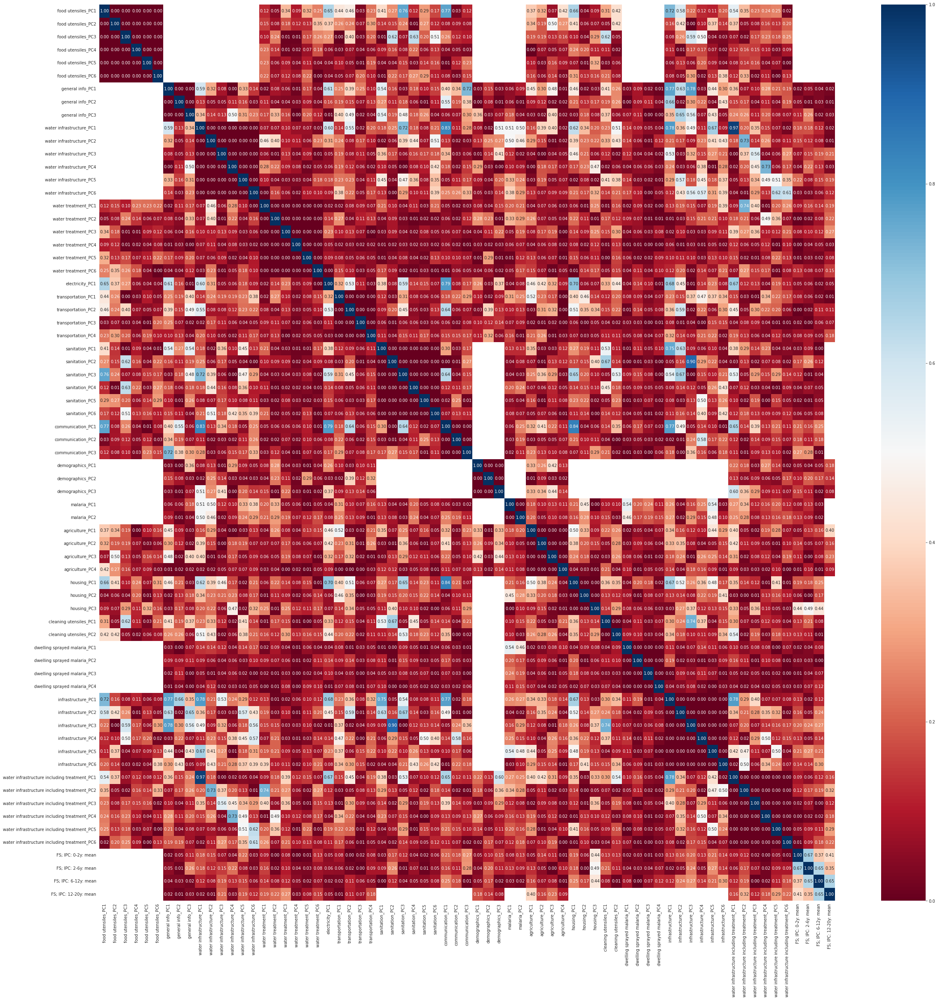

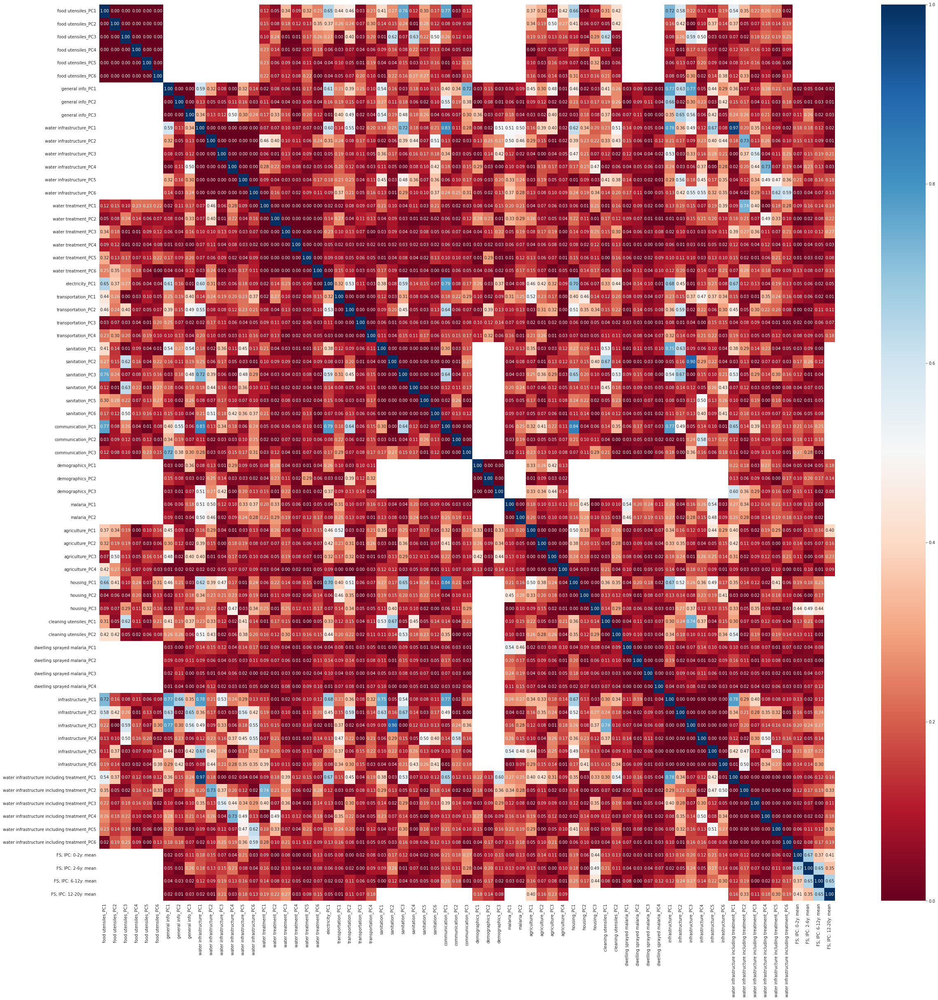

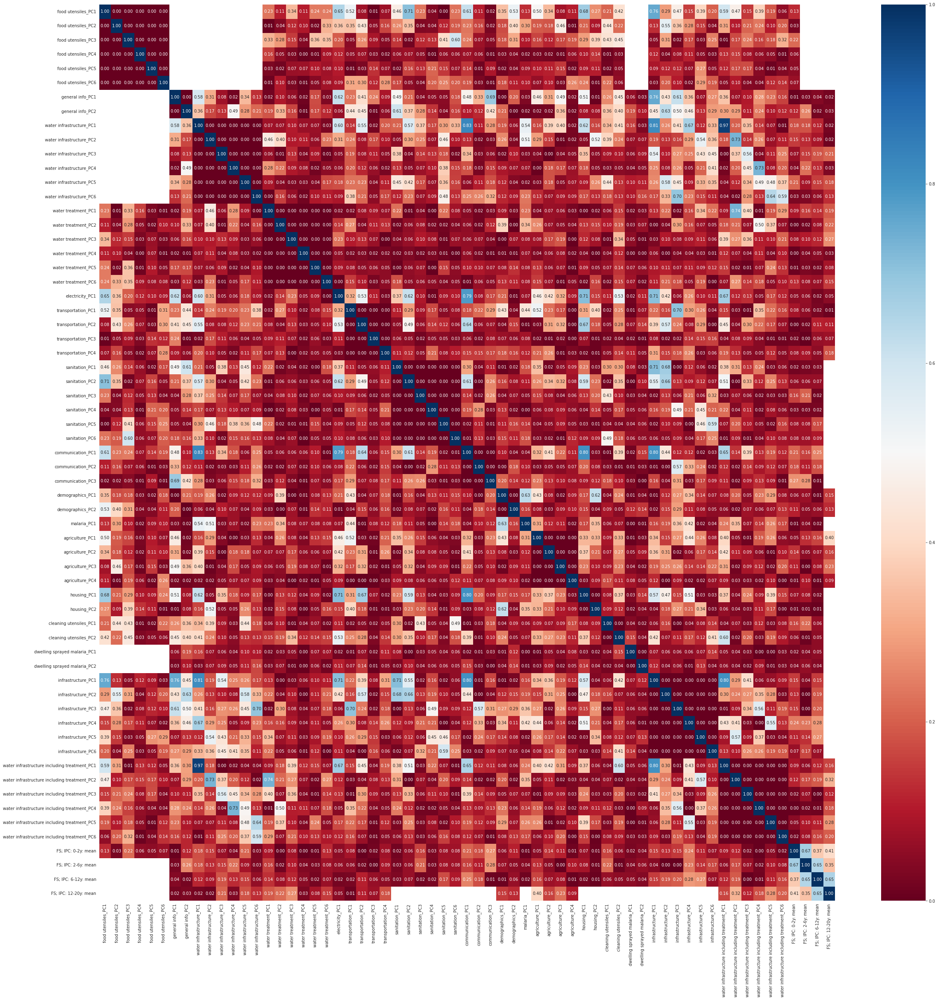

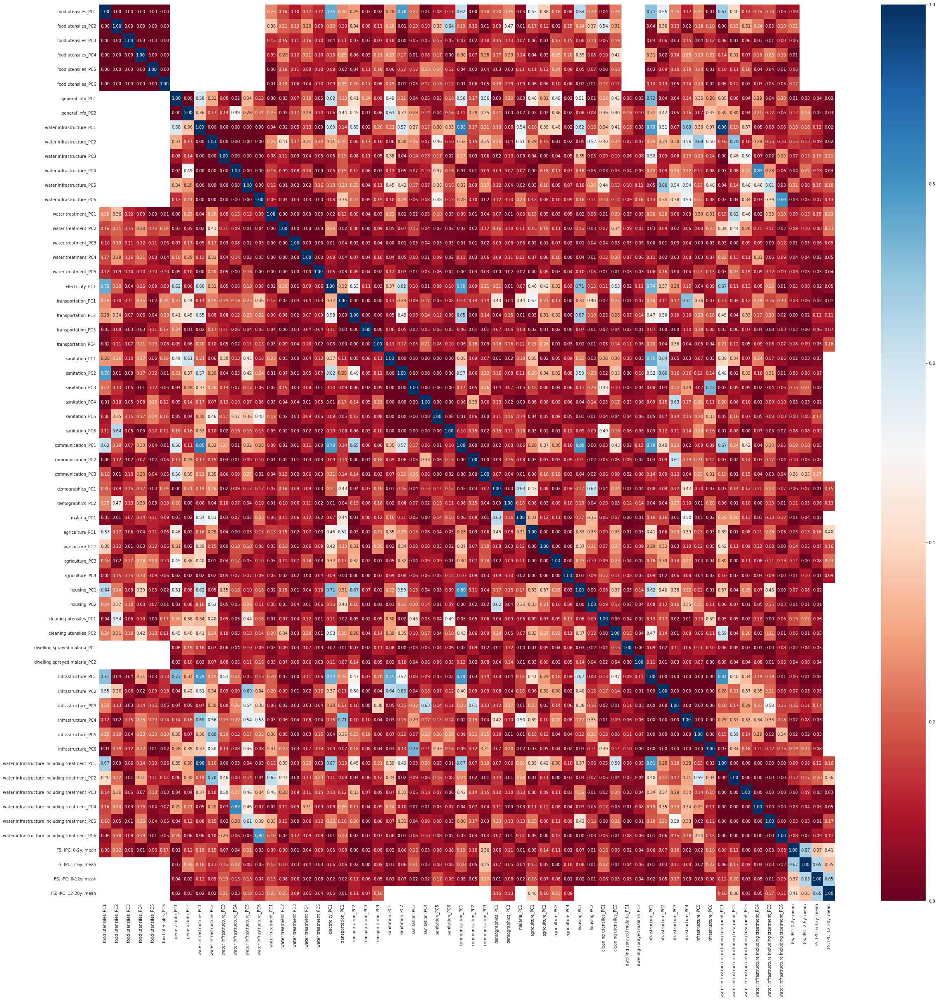

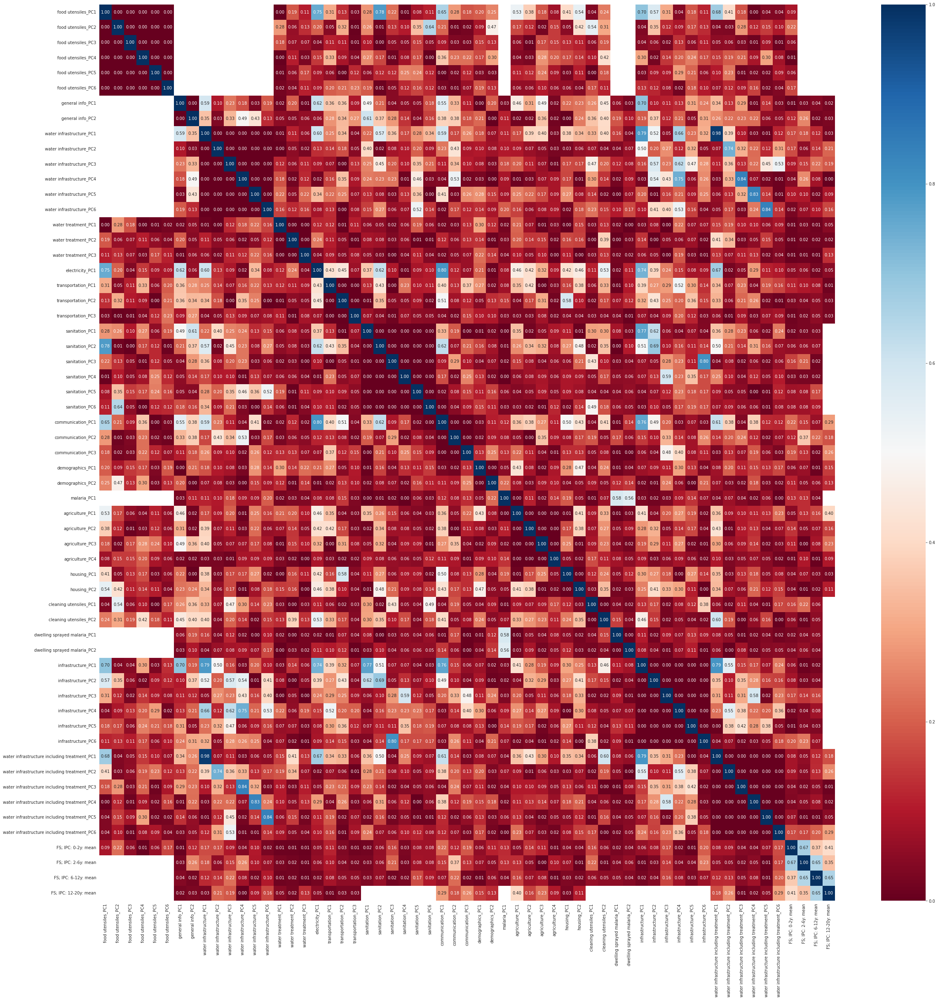

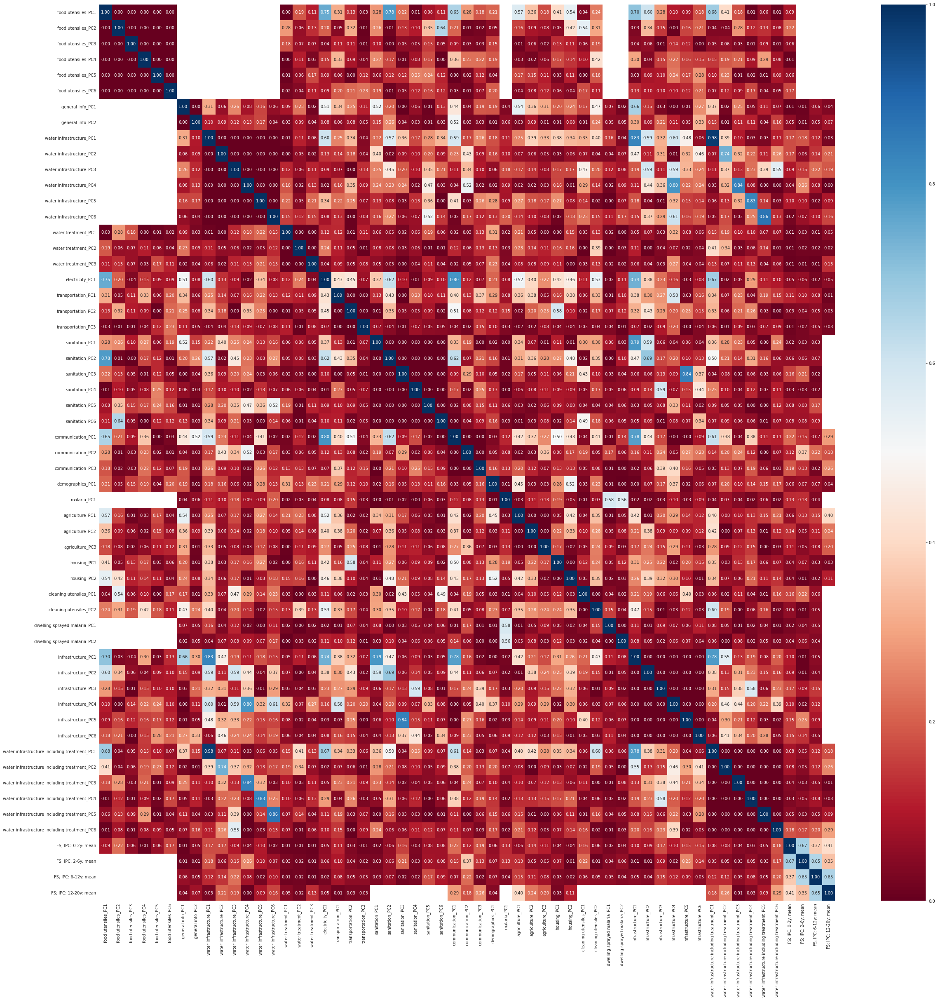

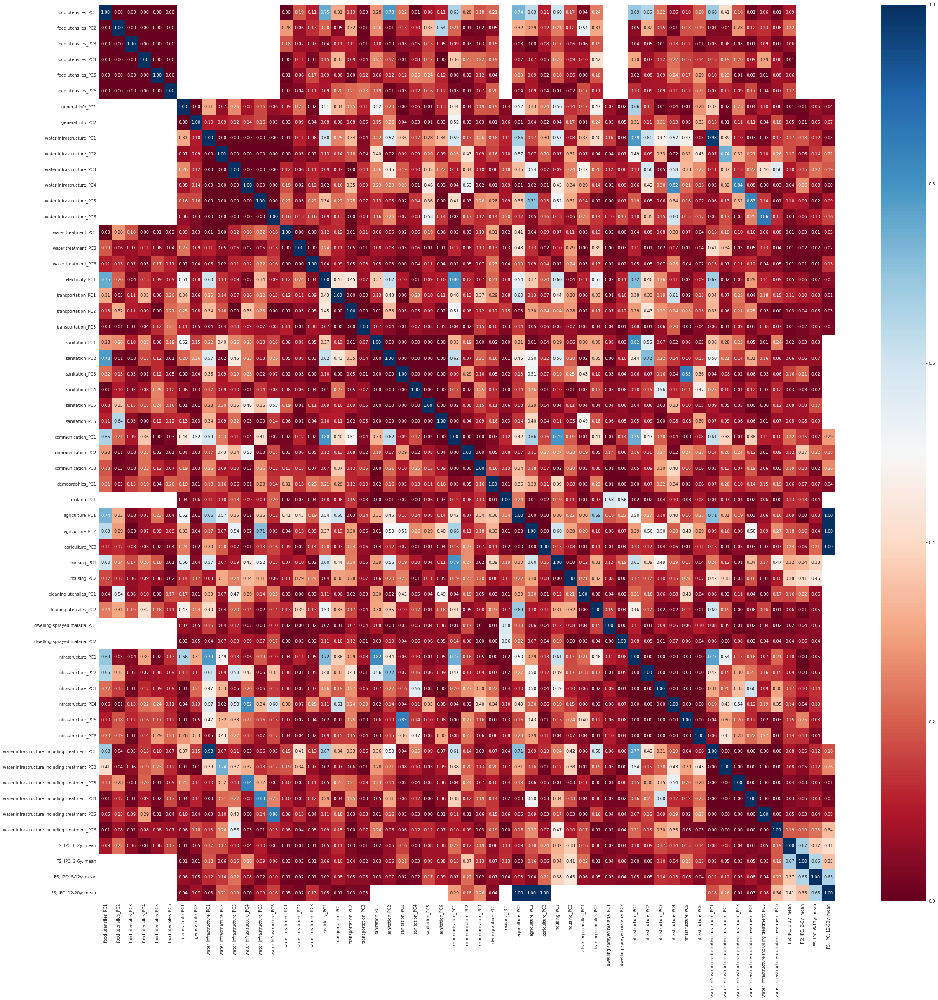

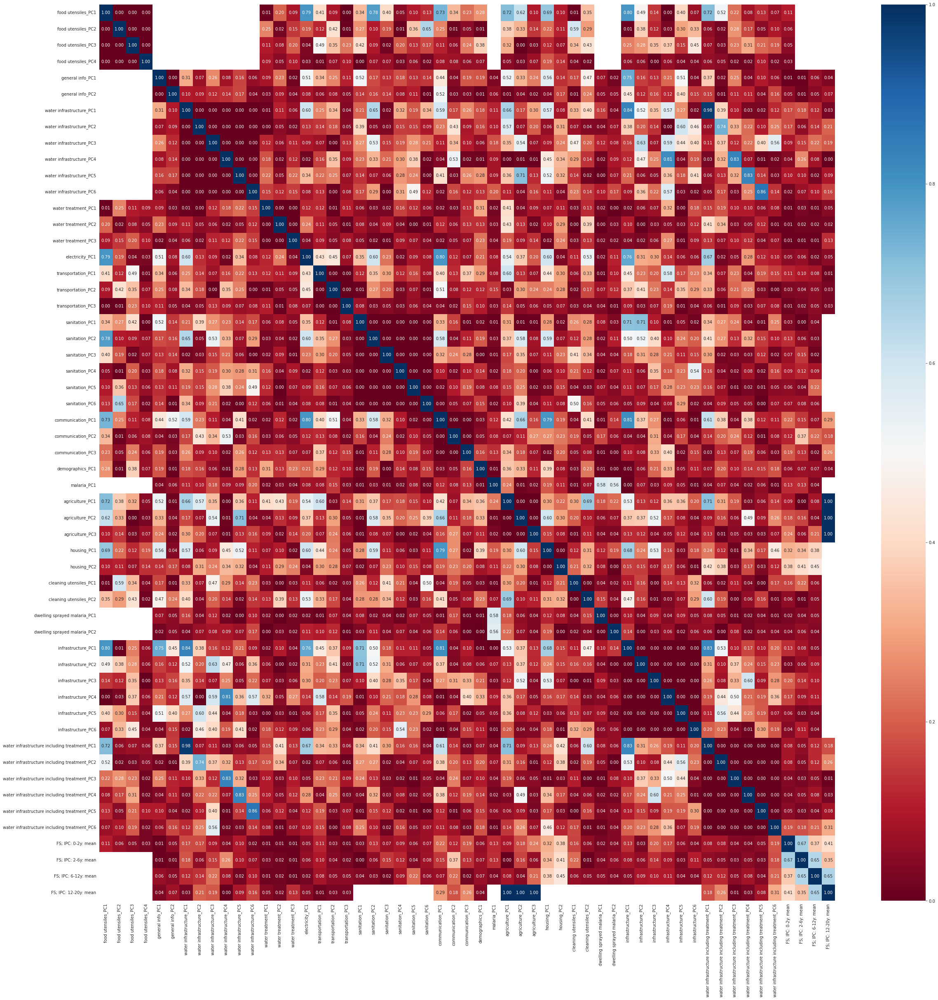

In [34]:
for perc, pca_df in pca_dfs_d.items():
    corr = pca_df.corr()
    # use absolute values
    corr = corr.abs()
    
    sns.set_style("whitegrid")

    # ic(corr)
    plt.figure(figsize=(40, 40))
    # sns.heatmap(corr, annot=False, cmap=plt.cm.Reds, fmt=".2f")
    sns.heatmap(corr, annot=True, cmap='RdBu', fmt=".2f")
    #save fig
    plt.savefig(base_out_name + f'_Categorical with available data of {perc} perc.png')